# Introduction to OSM Network Data

This Notebook is meant to be a brief guide on working with [Open Street Map (OSM)](https://www.openstreetmap.org/) network data, primarily using the [OSMnx](https://osmnx.readthedocs.io/) Python package. It walks through obtaining network data from OSMnx, exploring the data, and a simple use case of calculating free-flow travel time on the network.

Notebook author: **Alexander Michels**

## Notebook Outline:
1. [Introduction](#intro)
1. [Getting the Data](#getting-data)
1. [Exploring the Data](#exploring-data)
1. [Simple Use Case](#using-data)
1. [What's Next](#whats-next)
1. [References](#refs)

In [1]:
import folium
import geopandas as gpd
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import os
import osmnx as ox

plt.rcParams["figure.figsize"] = (20, 10)

/tmp/ipykernel_659/1210515768.py:2: DeprecationWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas still uses PyGEOS by default. However, starting with version 0.14, the default will switch to Shapely. To force to use Shapely 2.0 now, you can either uninstall PyGEOS or set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In the next release, GeoPandas will switch to using Shapely by default, even if PyGEOS is installed. If you only have PyGEOS installed to get speed-ups, this switch should be smooth. However, if you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


<hr id='intro'>

## Introduction

## What is OpenStreetMap?

OpenStreet map is a [Volunteer Geographic Information](https://en.wikipedia.org/wiki/Volunteered_geographic_information) platform which collects and houses geographic data from around the world.

Take a moment to explore the site! Find your current location on the map and see what else is in your vicinity! https://www.openstreetmap.org/

## What is OSMnx?

The OSMnx README puts it best:

>OSMnx is a Python package that lets you download geospatial data from OpenStreetMap and model, project, visualize, and analyze real-world street networks and any other geospatial geometries. You can download and model walkable, drivable, or bikeable urban networks with a single line of Python code then easily analyze and visualize them. You can just as easily download and work with other infrastructure types, amenities/points of interest, building footprints, elevation data, street bearings/orientations, and speed/travel time.

>If you use OSMnx in your work, please cite the journal article.

>Citation info: Boeing, G. 2017. "OSMnx: New Methods for Acquiring, Constructing, Analyzing, and Visualizing Complex Street Networks." Computers, Environment and Urban Systems 65, 126-139. doi:10.1016/j.compenvurbsys.2017.05.004

To learn more about OSMnx, view the resources below:

* [OSMnx Read the Docs](https://osmnx.readthedocs.io/en/stable/user-reference.html)
* [Dr. Boeing's paper on OSMnx](https://doi.org/10.1016/j.compenvurbsys.2017.05.004)

<hr id="getting-data"/>

# Getting the Data

There are a few ways to obtain OpenStreetMap data using the OSMNX.

Examples:

* Getting data from an address -> `graph_from_address`
* Getting data from a bounding box -> `graph_from_bbox`
* Getting data from a geocodable place -> `graph_from_place`
* Getting data around some point -> `graph_from_point`
* Getting data for some polygon -> `graph_from_polygon`

We will look at two examples below: graph from place and graph from address.

### graph_from_place

[Doc link](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.graph.graph_from_place)

Let's grab the network for UIUC, but specifically the driving network. You can check out the doc link above to see all of the options and default values. 

For our query, we are putting in the place we want to pull ("University of Illinois at Urbana-Champaign").

In [2]:
# osmnx graph_from_place
# https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.graph.graph_from_place
richardson_graph = ox.graph_from_place("Richardson, TX", network_type="drive")

Let's plot the graph to see what it looks like. We can plot the graph in a static image like so using `plot_graph`:

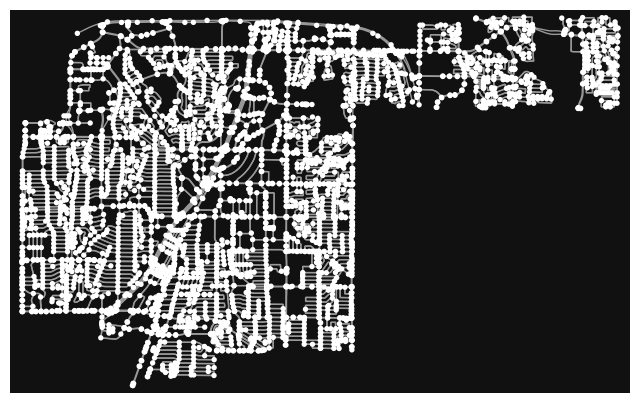

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [3]:
ox.plot_graph(richardson_graph)

It's difficult to tell what we are looking at from this image, so we can plot the graph on an interactive folium map using `plot_graph_folium`. 

Note that this works well for small graphs, but large ones (many nodes/edges) will result in errors and crashes, so be careful!

In [4]:
ox.plot_graph_folium(richardson_graph)

/tmp/ipykernel_659/1468274359.py:1: FutureWarning: The `folium` module has been deprecated and will be removed in the v2.0.0 release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  ox.plot_graph_folium(richardson_graph)


**Your turn!**

Think of a place you want to get a graph from! Maybe your college or hometown! 

You may want to use the [OpenStreetMap site](https://www.openstreetmap.org/) to make sure that the place you enter will be found. For example, while we were able to find UIUC by using the full name, just querying "UIUC" returns a result of a building in China.

Grab your graph from place and plot it!

*To add more cells below, select this cell and press the "B" key or use the "Insert a Cell Below" button in the top-right of this cell.*

### graph_from_address

[Doc link](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.graph.graph_from_address)

Let's grab the network around the Natural History Building where the Geography department is at UIUC. We will use the address and by default, osmnx grabs the network within a bounding box that is kilometer around it, but that can be changed with the `dist` parameter. Note that to get the driving network, we need to set `network_type` to "drive".

In [5]:
# osmnx graph_from_address
# https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.graph.graph_from_address
gr_graph = ox.graph_from_address("795 Drive D, Richardson, TX 75080", network_type="drive")

/cvmfs/iguide.purdue.edu/software/conda/iguide/lib/python3.8/site-packages/osmnx/graph.py:191: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  G = graph_from_bbox(


Let's plot the graph to see what it looks like. We can plot the graph in a static image like so using `plot_graph`:

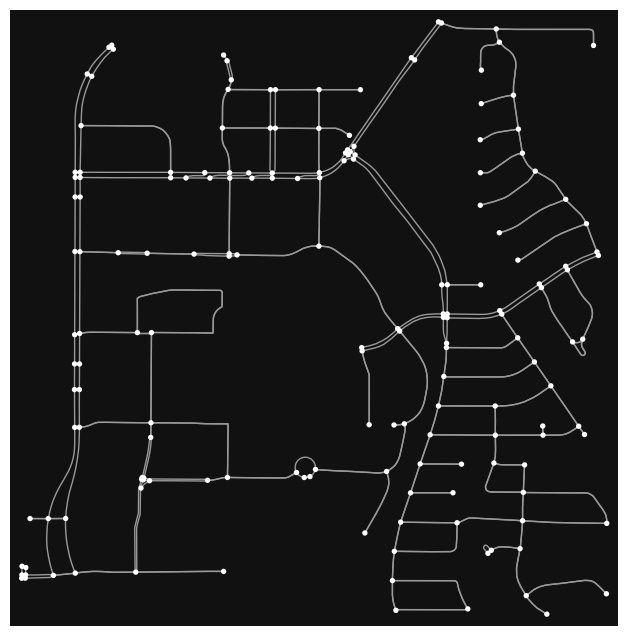

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [6]:
ox.plot_graph(gr_graph)

But we can also plot the graph on an interactive map using `folium`, specifically the `plot_graph_folium` function:

In [7]:
ox.plot_graph_folium(gr_graph)

/tmp/ipykernel_659/542205829.py:1: FutureWarning: The `folium` module has been deprecated and will be removed in the v2.0.0 release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  ox.plot_graph_folium(gr_graph)


**Your turn!**

Think of an address you want to get a graph from! Maybe a favorite restaurant or where you grew up!

Grab your graph and plot it!

### Saving and Loading OSMnx Networks

Getting large graphs from OSM can take a while, so many times it is useful to save the data and load it from you computer. The [io module](https://osmnx.readthedocs.io/en/stable/osmnx.html#module-osmnx.io) has lots of options, but we will use graphml.

Saving a network to graphml is relatively simple. Let's save it to "gr_graph.graphml".

In [8]:
ox.save_graphml(gr_graph, filepath="gr_graph.graphml")

Now if we want to use the graph again, we can grab it from the file using `load_graphml`:

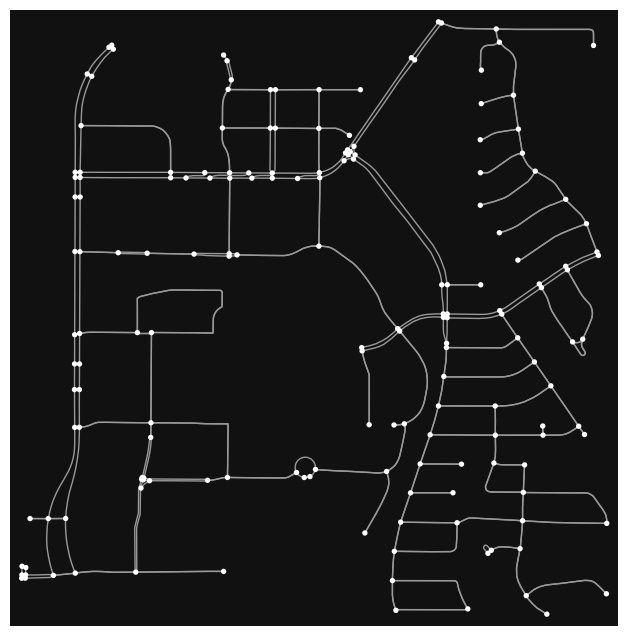

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [9]:
gr_graph = ox.load_graphml("gr_graph.graphml")
ox.plot_graph(gr_graph)

### Other Options for Grabbing Data

We won't go over the other options for grabbing network data, but offer some examples where they may be useful.

* `graph_from_bbox` - you are conducting a study in a given bounding box. Many times Twitter data comes at the granularity of bounding boxes.
* `graph_from_point` - you want to calculate network distances around a single point. You may want to calculate the driving-time distance to grocery stores around your address.
* `graph_from_polygon` - many geography studies depend on some geographic unit: county, state, etc. and this allows you pull the entire network for that unit. This is highly recommended over `graph_from_place` when you have a polygon to avoid confusion (i.e. Champaign County vs Champaign the city).

<hr id="exploring-data"/>

# Exploring the Data

Now that you've mastered getting the data, what can we do with it? First, let's see how to check out the node and edge attributes by convering it to a Geodataframe:

### OSMNX to Geopandas

If you're familiar with the `geopandas` package, we can convert the graph to a GeoDataFrame to examine our data as well using the `graph_to_gdfs` function:

In [10]:
# convert to geodataframe
node_gdf, edge_gdf = ox.graph_to_gdfs(gr_graph)

Now we can look at the data seperately:

In [11]:
# node data in a Geodataframe
node_gdf.head()

,y,x,street_count,highway,geometry
osmid,,,,,
81696746,32.979986,-96.739708,3,NaN,POINT (-96.73971 32.97999)
81696753,32.980536,-96.740439,3,NaN,POINT (-96.74044 32.98054)
81696767,32.981936,-96.740658,3,NaN,POINT (-96.74066 32.98194)
81696772,32.982766,-96.740568,4,stop,POINT (-96.74057 32.98277)
81696773,32.983610,-96.740542,4,NaN,POINT (-96.74054 32.98361)


And we can plot just the nodes using Geopandas

<Axes: >

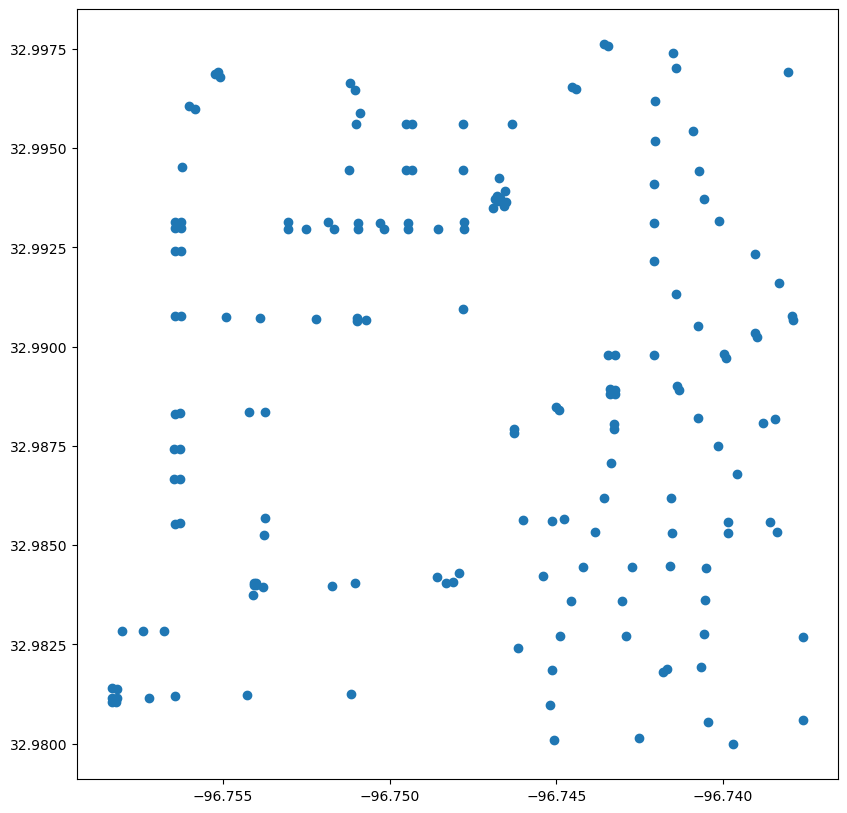

In [12]:
node_gdf.plot()

We can do the same with the edge Geodataframe

In [13]:
edge_gdf.head()

osmid lanes                name      highway  oneway  \
u        v        key                                                           
81696746 81696753 0    9952460     2  Copper Ridge Drive  residential   False   
81696753 81696767 0    9952460     2  Copper Ridge Drive  residential   False   
         81696746 0    9952460     2  Copper Ridge Drive  residential   False   
         81884412 0    9971854   NaN     Aspenwood Drive  residential   False   
81696767 81696772 0    9952460     2  Copper Ridge Drive  residential   False   

                      reversed   length  \
u        v        key                     
81696746 81696753 0      False   92.815   
81696753 81696767 0      False  164.271   
         81696746 0       True   92.815   
         81884412 0       True  292.399   
81696767 81696772 0      False   92.711   

                                                                geometry  \
u        v        key                                                      
81696746 81696753 0    LINESTRING (-96.73971 32.97999, -96.74006 32.9...   
81696753 81696767 0    LINESTRING (-96.74044 32.98054, -96.74058 32.9...   
         81696746 0    LINESTRING (-96.74044 32.98054, -96.74036 32.9...   
         81884412 0    LINESTRING (-96.74044 32.98054, -96.74018 32.9...   
81696767 81696772 0    LINESTRING (-96.74066 32.98194, -96.74064 32.9...   

                      maxspeed junction bridge  
u        v        key                           
81696746 81696753 0        NaN      NaN    NaN  
81696753 81696767 0        NaN      NaN    NaN  
         81696746 0        NaN      NaN    NaN  
         81884412 0        NaN      NaN    NaN  
81696767 81696772 0        NaN      NaN    NaN

<Axes: >

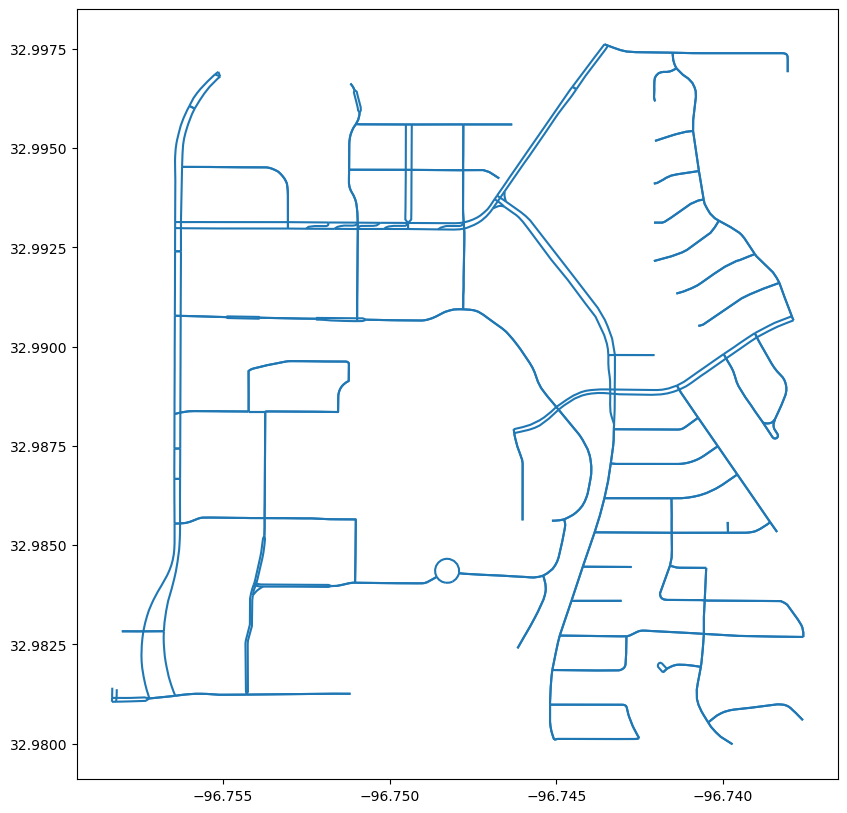

In [14]:
edge_gdf.plot()

**Your turn**

Examine the data for one of the networks above!

<hr id="using-data"/>

# Simple Use Case

Let's calculate the driving time from the Natural History Building to each other node in our network!

First, we will use the `add_edge_speeds` function to try to figure out what the speed limit is on roads which don't have the data, then use the `add_edge_travel_times` function to calculate the travel time in seconds for each edge using the distance and speed limits:

In [15]:
gr_graph = ox.add_edge_speeds(gr_graph)

In [16]:
gr_graph = ox.add_edge_travel_times(gr_graph)

Let's find the nearest node on our network to the Natural History Building! These coordinates are from Google Maps.

In [17]:
gr_coords = (32.98840180214906, -96.74779649999999)
gr_node = ox.nearest_nodes(gr_graph, X=gr_coords[1], Y=gr_coords[0])
print(gr_node)

150173943


Let's highlight the node in red. We can make a list of colors to assign to each node and pass those colors to the `plot_graph` function.

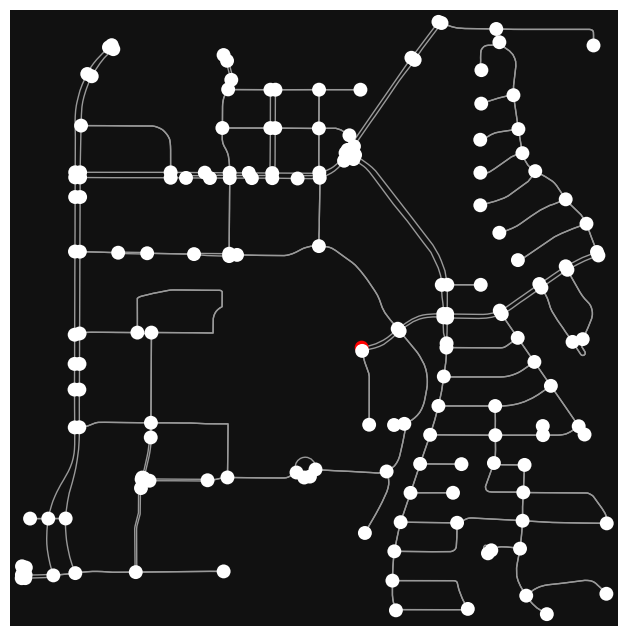

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [18]:
node_colors = ['red' if node == gr_node else 'white' for node in gr_graph.nodes()]
ox.plot_graph(gr_graph, node_size=100, node_color=node_colors)

Now that we know where the Natural History Building is on our graph, let's calculate the driving-time distances for the nodes in our network from the Natural History Building. We will use the networkx function [`single_source_dijkstra_path_length`](https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.shortest_paths.weighted.single_source_dijkstra_path_length.html#networkx.algorithms.shortest_paths.weighted.single_source_dijkstra_path_length) to calculate distances from our node. To use the travel times calculated by OSMnx, we will set the `weight` parameter to `travel_time`.

In [19]:
distances = nx.single_source_dijkstra_path_length(gr_graph,
                                                  gr_node,
                                                  weight="travel_time")

Let's look at our distances. They are a dictionary mapping node id to travel time:

In [20]:
print(distances)

{150173943: 0, 11209569312: 1.2, 5085766871: 17.3, 150173957: 18.400000000000002, 81883871: 28.9, 9115722468: 34.8, 150098001: 35.699999999999996, 150098029: 36.599999999999994, 150098003: 37.599999999999994, 9115722471: 41.3, 150097999: 42.4, 150098039: 43.8, 150098005: 45.199999999999996, 150174180: 49.3, 150097995: 49.6, 150173969: 50.3, 150378771: 52.0, 150203590: 56.4, 81705267: 57.0, 81883867: 58.2, 150174168: 61.099999999999994, 150173980: 62.099999999999994, 5693770180: 62.1, 5085766874: 62.5, 150235406: 63.6, 81797700: 64.4, 150174158: 68.89999999999999, 150173985: 69.89999999999999, 150219130: 70.8, 81705266: 71.0, 81887506: 72.0, 1100713813: 74.10000000000001, 150375397: 76.6, 150174150: 77.3, 150173989: 78.2, 81797694: 79.1, 81998766: 79.5, 150375401: 79.5, 81887507: 82.2, 81797676: 82.89999999999999, 150082853: 83.9, 3097952522: 85.30000000000001, 1592187888: 85.39999999999999, 150247669: 85.60000000000001, 3100840876: 86.10000000000001, 5268801214: 86.10000000000001, 3097

In [21]:
not_reachable = set(node_gdf.index) - set(distances.keys())  # just in case there are nodes not reachable
for nr in not_reachable:
    distances[nr] = -1

With this data, we can add the travel time to our graph:

In [22]:
nx.set_node_attributes(gr_graph, distances, "time2gr")

Now let's plot the graph, coloring the nodes by travel time distance from the Natural History Building.

In [23]:
node_colors = ox.plot.get_node_colors_by_attr(gr_graph, "time2gr", cmap="RdYlBu")

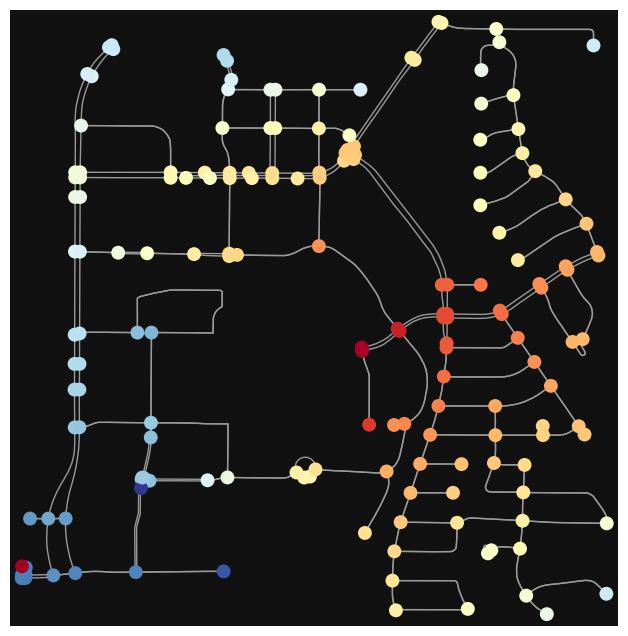

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [24]:
ox.plot_graph(gr_graph, node_color=node_colors, node_size=100)

**Your turn**

Can you perform this calculation for the graph you've pulled? Maybe calculate travel time from your house?

<hr id="whats-next"/>

# What's Next?

### What else can I do with OSMnx Network Data?

This is just a very brief tour of osmnx specifically for network data. The package can do a lot more. To access the example notebooks from the `osmnx-examples` repository on I-GUIDE Platform, you can [click this link](https://jupyter.iguide.illinois.edu/hub/user-redirect/git-pull?repo=https%3A%2F%2Fgithub.com%2Fgboeing%2Fosmnx-examples&urlpath=tree%2Fosmnx-examples%2Fnotebooks%2F00-osmnx-features-demo.ipynb&branch=main). When the notebook opens, select the `iguide` kernel.

Here are some notebooks on the I-GUIDE Platform that use osmnx data:

* [Build Road Networks](https://platform.i-guide.io/notebooks/34f5f70c-708e-42aa-9bad-395455209c02)
* [Looking Up Places through Nominatim API/OSMNX](https://platform.i-guide.io/notebooks/8a77279b-d8e4-4475-b3ff-b49320ce2b58)
* [Introduction to Osmosis and OSMFilter](https://platform.i-guide.io/notebooks/d971513d-1c83-4abf-8e32-f257edf91ae1)

More applied notebooks:

* [Calculating Spatial Accessibility with Areal Two-Step Floating Catchment Area (A2SFCA) Method](https://platform.i-guide.io/notebooks/3b45070e-a63e-496f-9493-0947d680192e)
* [SPASTC: a Spatial Partitioning Algorithm for Scalable Travel-time Computation](https://platform.i-guide.io/notebooks/b1fa548b-6351-470a-8a14-ef1b27388d56)
* [FireABM Modeling Notebook](https://platform.i-guide.io/notebooks/5278e805-168c-448e-95b8-056ff3b6b8c3)

<a id='refs'></a>
## References

* [Dr. Boeing's blog post on OSMnx](https://geoffboeing.com/2016/11/osmnx-python-street-networks/)
* [Dr. Boeing's paper on OSMnx](doi.org/10.1016/j.compenvurbsys.2017.05.004)
* [OSMnx Examples](https://github.com/gboeing/osmnx-examples)
* [OSMnx Github](https://github.com/gboeing/osmnx)
